In [6]:
import torch
import numpy as np
import cv2
from sklearn.metrics import jaccard_score
from clustering import DinoModel
from gaussian_renderer import render
from arguments import PipelineParams, get_combined_args
from utils.camera_utils import loadCam  # Assuming there's a function to load camera data from cameras.py
from argparse import Namespace
from argparse import Namespace, ArgumentParser  # Importing argparse

In [2]:
# Set up the parameters
model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\85959dba-6\\all_vars.pth"
camera_data_path = "C:\\Users\\ykirc\\Desktop\\input-scenes\\wallet\\1a00dded\\images"
mask_images_path = "C:\\Users\\ykirc\\Desktop\\1a00dded"
num_images = 29

In [7]:
import torch
from utils.camera_utils import Camera
from clustering import DinoModel
from gaussian_renderer import render
from arguments import ModelParams, PipelineParams
import argparse
import os

In [13]:
# Step 1: Create an argument parser
parser = argparse.ArgumentParser(description="Model and Pipeline Parameters")

# Step 2: Initialize ModelParams and PipelineParams
model_params = ModelParams(parser)
pipeline_params = PipelineParams(parser)

# Step 3: Parse the arguments and set the model path
args = parser.parse_args([])  # Use empty list to parse default values

# Manually set the model path to the actual location of your model file
args.model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\85959dba-6\\all_vars.pth"

# Extract the parameters
model_args = model_params.extract(args)
pipe_args = pipeline_params.extract(args)

# Step 4: Initialize the DinoModel with the extracted parameters
dino_model = DinoModel(model_args, pipe_args)

# Step 5: Load the pre-trained Gaussian model
dino_model.load_model(args.model_path)

sorted_cameras = sorted(dino_model.cameras, key=lambda x: int(x.image_name))


[Loading the gaussian model]


c:\Users\ykirc\Documents\GitHub\thesis\sequential-training\clustering.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  saved_dict = torch.load(model_path)


[Gaussian model created successfully]

[Loading the gaussian model]
[Gaussian model created successfully]


## Feature Visualization for a single DINO

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.201997..11.7095785].


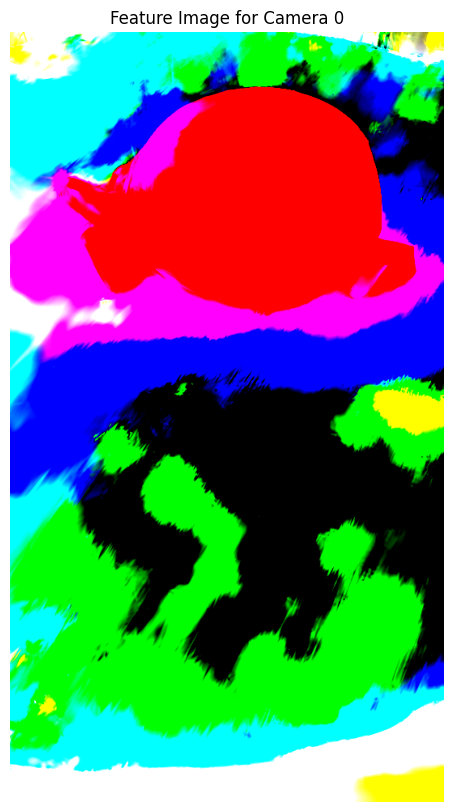

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.173419..11.72565].


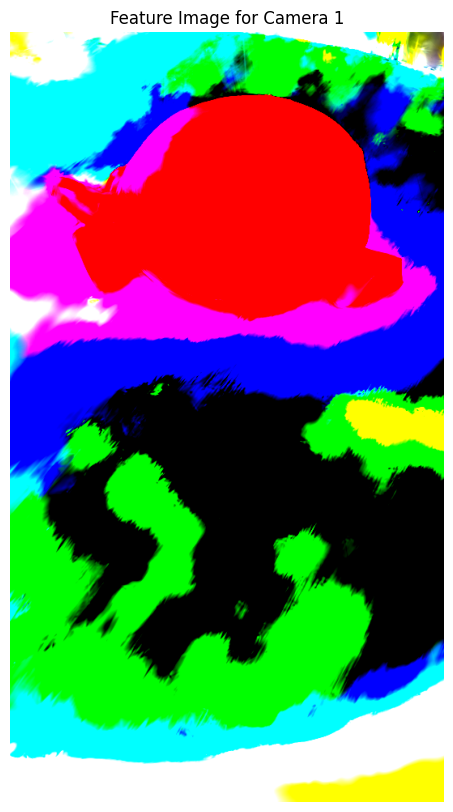

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.157077..11.697898].


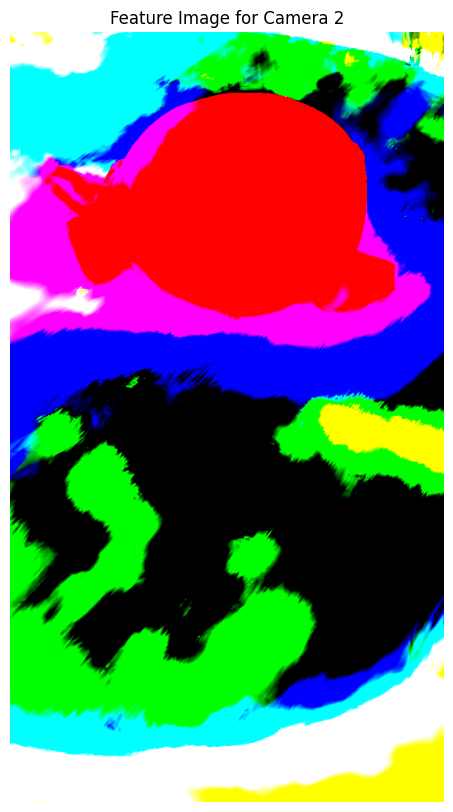

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.033909..11.499816].


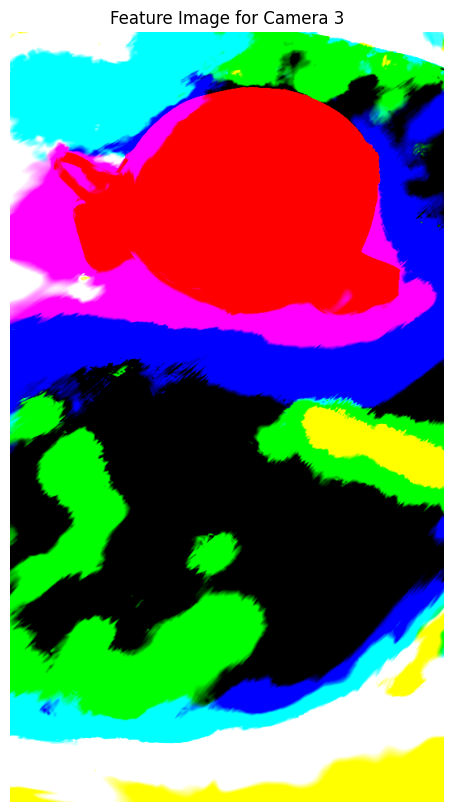

Rendered 29 feature images


In [14]:
import torch
import numpy as np
from clustering import DinoModel
from gaussian_renderer import render
from scene import Scene, GaussianModel
from arguments import ModelParams, PipelineParams
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


# Function to render feature images
def render_feature_image(camera, mode='dino1'):
    with torch.no_grad():
        render_pkg = render(camera, dino_model.gaussians, dino_model.pipe, 
                            torch.tensor([0.0, 0.0, 0.0], device="cuda"), mode=mode)
        image = render_pkg['render']
    return image.cpu().numpy()

# Render feature images for all cameras
feature_images = []
for cam_id, camera in enumerate(sorted_cameras):
    feature_image = render_feature_image(camera)
    feature_images.append(feature_image)
    
    # Visualize the first few feature images
    if cam_id < 4:
        plt.figure(figsize=(10, 10))
        plt.imshow(feature_image.transpose(1, 2, 0))
        plt.title(f"Feature Image for Camera {cam_id}")
        plt.axis('off')
        plt.show()

print(f"Rendered {len(feature_images)} feature images")

In [16]:
import torch
import numpy as np
from clustering import DinoModel
from gaussian_renderer import render
from scene import Scene, GaussianModel
from arguments import ModelParams, PipelineParams
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import cv2

# Function to render RGB images
def render_rgb_image(camera):
    with torch.no_grad():
        render_pkg = render(camera, dino_model.gaussians, dino_model.pipe, 
                            torch.tensor([0.0, 0.0, 0.0], device="cuda"), mode='rgb')
        image = render_pkg['render']
    return (image.cpu().numpy() * 255).astype(np.uint8).transpose(1, 2, 0)

# Render RGB and feature images for all cameras
rgb_images = []
feature_images = []
for cam_id, camera in enumerate(sorted_cameras):
    rgb_image = render_rgb_image(camera)
    feature_image = render_feature_image(camera)
    rgb_images.append(rgb_image)
    feature_images.append(feature_image)

# Function to visualize results
def visualize_results(rgb_images, feature_images, mask_images, rendered_segmentations, num_samples=4):
    fig, axes = plt.subplots(num_samples, 4, figsize=(20, 5*num_samples))
    for i in range(num_samples):
        axes[i, 0].imshow(rgb_images[i])
        axes[i, 0].set_title(f"RGB Image {i}")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(feature_images[i].transpose(1, 2, 0))
        axes[i, 1].set_title(f"Feature Image {i}")
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(mask_images[i], cmap='gray')
        axes[i, 2].set_title(f"Mask Image {i}")
        axes[i, 2].axis('off')
        
        axes[i, 3].imshow(rendered_segmentations[i], cmap='gray')
        axes[i, 3].set_title(f"Rendered Segmentation {i}")
        axes[i, 3].axis('off')
    
    plt.tight_layout()
    plt.show()

# Visualize results
visualize_results(rgb_images, feature_images, mask_images, clustered_images)

NameError: name 'clustered_images' is not defined

## Multi DINO Feature Vis

### Multi Feature Visulatization Plot

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.201997..11.7095785].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.787243..8.796179].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.8244634..4.823498].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.895235..5.464789].


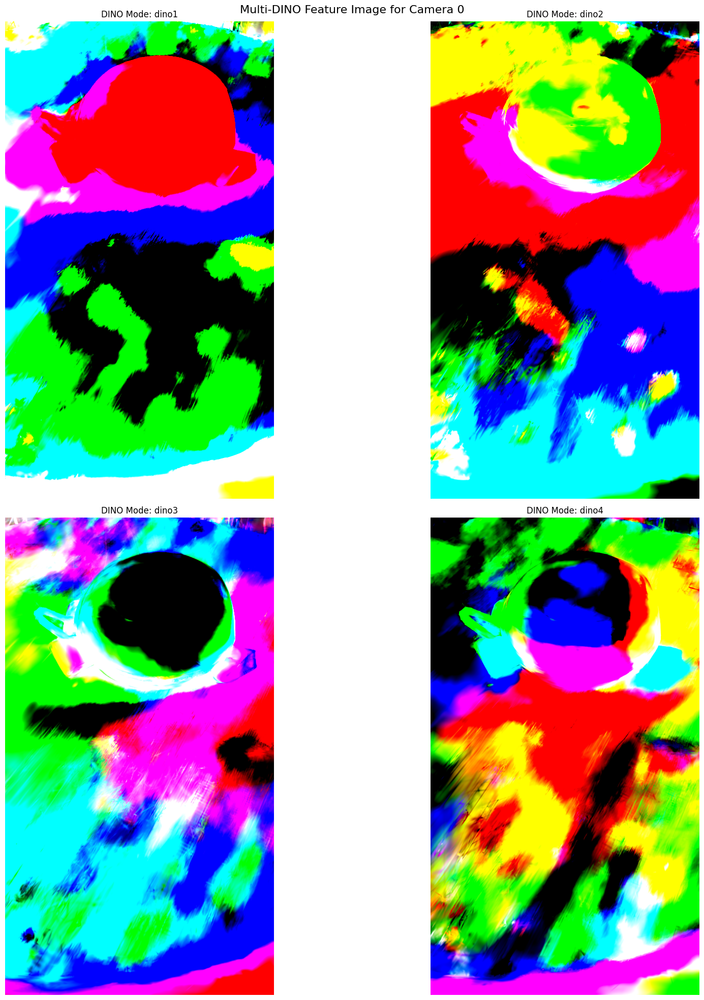

Rendered 29 multi-DINO feature images


c:\Users\ykirc\.conda\envs\tf-gpu7\lib\site-packages\threadpoolctl.py:1214: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


In [17]:
def render_multi_dino_feature_image(camera):
    dino_modes = ['dino1', 'dino2', 'dino3', 'dino4']
    feature_images = []
    
    with torch.no_grad():
        for mode in dino_modes:
            render_pkg = render(camera, dino_model.gaussians, dino_model.pipe, 
                                torch.tensor([0.0, 0.0, 0.0], device="cuda"), mode=mode)
            image = render_pkg['render']
            feature_images.append(image.cpu().numpy())
    
    # Concatenate all DINO features
    return np.concatenate(feature_images, axis=0)

# Render feature images for all cameras
multi_dino_feature_images = []
for cam_id, camera in enumerate(sorted_cameras):
    multi_dino_image = render_multi_dino_feature_image(camera)
    255 - multi_dino_image
    multi_dino_feature_images.append(multi_dino_image)
    
    # Visualize the first few feature images
    if cam_id < 1:
        fig, axes = plt.subplots(2, 2, figsize=(20, 20))
        fig.suptitle(f"Multi-DINO Feature Image for Camera {cam_id}", fontsize=16)
        for i, mode in enumerate(['dino1', 'dino2', 'dino3', 'dino4']):
            ax = axes[i // 2, i % 2]
            ax.imshow(multi_dino_image[i*3:(i+1)*3].transpose(1, 2, 0))
            ax.set_title(f"DINO Mode: {mode}")
            ax.axis('off')
        plt.tight_layout()
        plt.show()

print(f"Rendered {len(multi_dino_feature_images)} multi-DINO feature images")

# Now let's update our clustering function to use all DINO features
def cluster_multi_dino_feature_image(feature_image, n_clusters=2):
    c, h, w = feature_image.shape
    feature_image_flat = feature_image.reshape(c, -1).T
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(feature_image_flat)
    return labels.reshape(h, w)

# Cluster the multi-DINO feature images
clustered_images = [cluster_multi_dino_feature_image(img) for img in multi_dino_feature_images]

### Comparison Plot

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.201997..11.7095785].


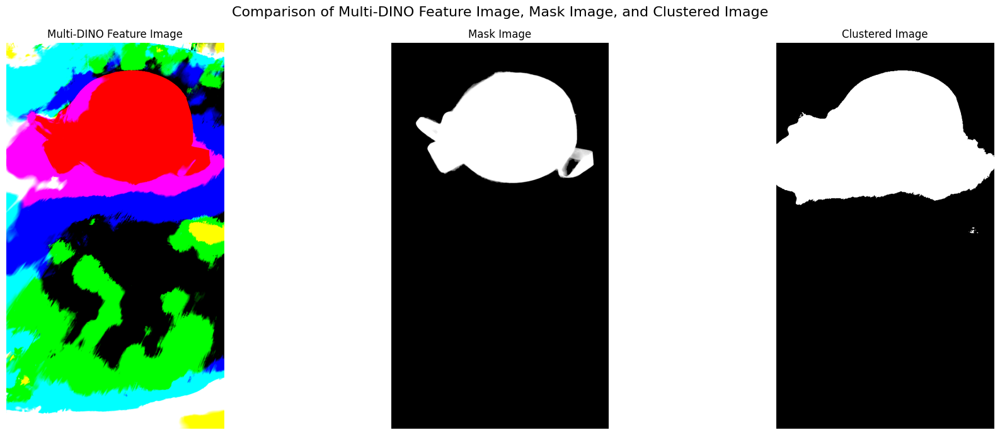

In [51]:
# Visualization of results (showing one example)
fig, axes = plt.subplots(1, 3, figsize=(20, 7))
fig.suptitle("Comparison of Multi-DINO Feature Image, Mask Image, and Clustered Image", fontsize=16)

example_idx = 0  # You can change this to view different images

# Multi-DINO Feature Image (showing first 3 channels for visualization)
axes[0].imshow(multi_dino_feature_images[example_idx][:3].transpose(1, 2, 0))
axes[0].set_title("Multi-DINO Feature Image")
axes[0].axis('off')

# Mask Image
axes[1].imshow(mask_images[example_idx], cmap='gray')
axes[1].set_title("Mask Image")
axes[1].axis('off')

# Clustered Image
axes[2].imshow(255 - clustered_images[example_idx], cmap='gray')
axes[2].set_title("Clustered Image")
axes[2].axis('off')

plt.tight_layout()
plt.show()

In [74]:
feature_images[0].shape

(3, 951, 536)

## Loading Mask Images

In [18]:
import os
import cv2
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

mask_images_path = "C:\\Users\\ykirc\\Desktop\\1a00dded"
num_images = 29

def load_mask_images(path, num_images):
    mask_images = []
    for i in range(num_images):
        mask_path = os.path.join(path, f"{i:03d}.jpg.png")
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            print(f"Warning: Unable to load image at {mask_path}")
            continue
        mask = mask / 255.0  # Normalize to [0, 1]
        mask_images.append(mask)
    return mask_images

mask_images = load_mask_images(mask_images_path, num_images)

print(f"Loaded {len(mask_images)} mask images")


Loaded 28 mask images


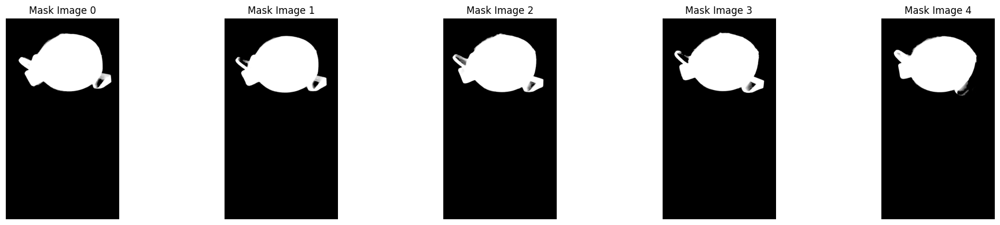

In [19]:
# Visualize the first few mask images to verify
num_vis = min(5, len(mask_images))
fig, axes = plt.subplots(1, num_vis, figsize=(20, 4))
for i in range(num_vis):
    axes[i].imshow(mask_images[i], cmap='gray')
    axes[i].set_title(f"Mask Image {i}")
    axes[i].axis('off')
plt.tight_layout()
plt.show()


## Comparison Visualization

In [54]:
import os
import cv2
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

def cluster_feature_image(feature_image, n_clusters=2):
    h, w, c = feature_image.shape
    feature_image_flat = feature_image.reshape(-1, c)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(feature_image_flat)
    return labels.reshape(h, w)

# Cluster feature images
clustered_images = []
for img in feature_images:
    # Ensure the feature image is in the correct shape (H, W, C)
    if img.shape[0] == 3:
        img = img.transpose(1, 2, 0)
    clustered = cluster_feature_image(img)
    clustered
    clustered_images.append(clustered)

In [55]:
def cluster_multi_dino_feature_image(feature_image, n_clusters=2):
    c, h, w = feature_image.shape
    feature_image_flat = feature_image.reshape(c, -1).T
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(feature_image_flat)
    return labels.reshape(h, w)

# Cluster the multi-DINO feature images
clustered_images = [cluster_multi_dino_feature_image(img) for img in multi_dino_feature_images]

# Resize mask images to match clustered images
resized_mask_images = []
for mask, clustered in zip(mask_images, clustered_images):
    resized_mask = cv2.resize(mask, (clustered.shape[1], clustered.shape[0]), interpolation=cv2.INTER_NEAREST)
    resized_mask_images.append(resized_mask)

# Verification
print(f"Clustered image shape: {clustered_images[0].shape}")
print(f"Resized mask image shape: {resized_mask_images[0].shape}")

Clustered image shape: (951, 536)
Resized mask image shape: (951, 536)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.033909..11.499816].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.691393..11.331905].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.001656..11.702158].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.140008..11.795209].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.890512..11.349783].


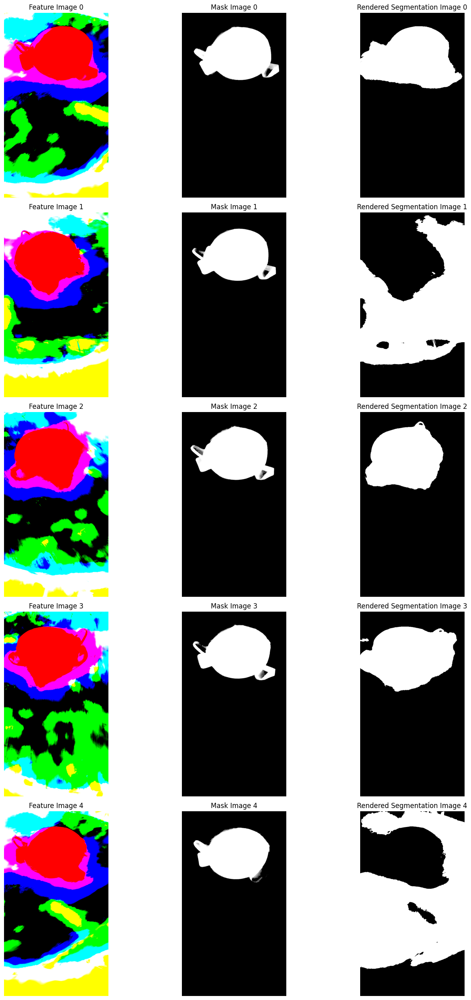

In [39]:
num_vis = min(5, num_images)
fig, axes = plt.subplots(num_vis, 3, figsize=(15, 5*num_vis))

for i in range(num_vis):
    axes[i, 0].imshow(feature_images[i].transpose(1, 2, 0))
    axes[i, 0].set_title(f"Feature Image {i}")
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(resized_mask_images[i], cmap='gray')
    axes[i, 1].set_title(f"Mask Image {i}")
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(255 - clustered_images[i], cmap='gray')
    axes[i, 2].set_title(f"Rendered Segmentation Image {i}")
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

## MIOU Calculation

In [56]:
# Calculate mIOU
def calculate_iou(pred, target):
    intersection = np.logical_and(pred, target)
    union = np.logical_or(pred, target)
    iou = np.sum(intersection) / np.sum(union)
    return iou

def calculate_miou(predictions, targets):
    ious = []
    for pred, target in zip(predictions, targets):
        # Try both label assignments (0 as foreground or 1 as foreground)
        iou_0 = calculate_iou(pred == 0, target)
        iou_1 = calculate_iou(pred == 1, target)
        ious.append(max(iou_0, iou_1))
    return np.mean(ious)

miou = calculate_miou(clustered_images, resized_mask_images)
print(f"mIOU using multi-DINO features: {miou:.4f}")

mIOU using multi-DINO features: 0.5867


In [57]:
# Calculate mIOU
def calculate_iou(pred, target):
    intersection = np.logical_and(pred, target)
    union = np.logical_or(pred, target)
    return np.sum(intersection) / np.sum(union)

def calculate_miou(predictions, targets):
    ious = []
    for pred, target in zip(predictions, targets):
        # Try both label assignments (0 as foreground or 1 as foreground)
        iou_0 = calculate_iou(pred == 0, target)
        iou_1 = calculate_iou(pred == 1, target)
        ious.append(max(iou_0, iou_1))
    return np.mean(ious)

miou = calculate_miou(clustered_images, resized_mask_images)
print(f"mIOU: {miou:.4f}")

mIOU: 0.5867


## Function for Other results

### Code for Function Def - Main


[Loading the gaussian model]


c:\Users\ykirc\Documents\GitHub\thesis\sequential-training\clustering.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  saved_dict = torch.load(model_path)


[Gaussian model created successfully]

[Loading the gaussian model]
[Gaussian model created successfully]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.201997..11.7095785].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.173419..11.72565].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.157077..11.697898].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.033909..11.499816].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.9845295..11.414716].


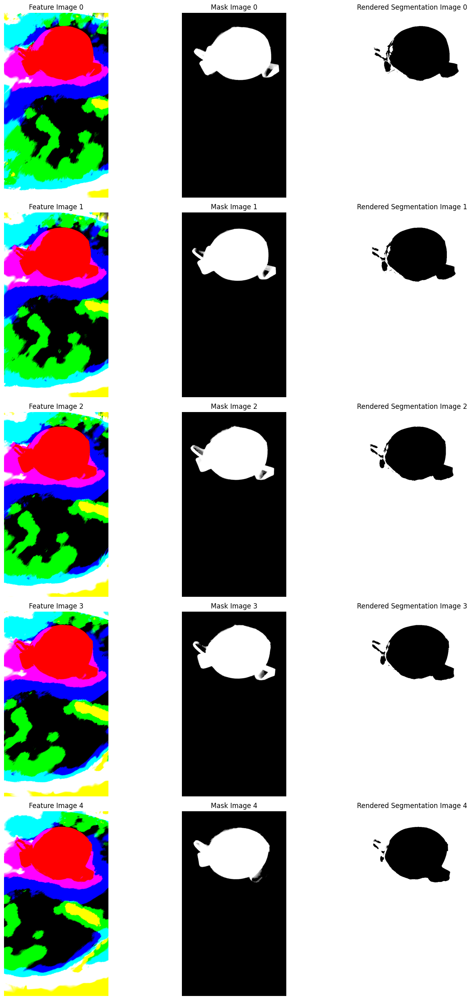

mIOU using multi-DINO features: 0.7651


In [67]:
# Step 1: Create an argument parser
parser = argparse.ArgumentParser(description="Model and Pipeline Parameters")

# Step 2: Initialize ModelParams and PipelineParams
model_params = ModelParams(parser)
pipeline_params = PipelineParams(parser)

# Step 3: Parse the arguments and set the model path
args = parser.parse_args([])  # Use empty list to parse default values

# Manually set the model path to the actual location of your model file
args.model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\85959dba-6\\all_vars.pth"

# Extract the parameters
model_args = model_params.extract(args)
pipe_args = pipeline_params.extract(args)

# Step 4: Initialize the DinoModel with the extracted parameters
dino_model = DinoModel(model_args, pipe_args)

# Step 5: Load the pre-trained Gaussian model
dino_model.load_model(args.model_path)

sorted_cameras = sorted(dino_model.cameras, key=lambda x: int(x.image_name))

multi_dino_feature_images = []
for cam_id, camera in enumerate(sorted_cameras):
    multi_dino_image = render_multi_dino_feature_image(camera)
    255 - multi_dino_image
    multi_dino_feature_images.append(multi_dino_image)


mask_images_path = "C:\\Users\\ykirc\\Desktop\\1a00dded"
num_images = 29

def load_mask_images(path, num_images):
    mask_images = []
    for i in range(num_images):
        mask_path = os.path.join(path, f"{i:03d}.jpg.png")
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            print(f"Warning: Unable to load image at {mask_path}")
            continue
        mask = mask / 255.0  # Normalize to [0, 1]
        mask_images.append(mask)
    return mask_images

mask_images = load_mask_images(mask_images_path, num_images)


def cluster_multi_dino_feature_image(feature_image, n_clusters=2):
    return cluster_with_meanshift(feature_image)

# Cluster the multi-DINO feature images
clustered_images = [cluster_multi_dino_feature_image(img) for img in multi_dino_feature_images]

# Resize mask images to match clustered images
resized_mask_images = []
for mask, clustered in zip(mask_images, clustered_images):
    resized_mask = cv2.resize(mask, (clustered.shape[1], clustered.shape[0]), interpolation=cv2.INTER_NEAREST)
    resized_mask_images.append(resized_mask)


num_vis = min(5, num_images)
fig, axes = plt.subplots(num_vis, 3, figsize=(15, 5*num_vis))

for i in range(num_vis):
    axes[i, 0].imshow(feature_images[i].transpose(1, 2, 0))
    axes[i, 0].set_title(f"Feature Image {i}")
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(resized_mask_images[i], cmap='gray')
    axes[i, 1].set_title(f"Mask Image {i}")
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(255 - clustered_images[i], cmap='gray')
    axes[i, 2].set_title(f"Rendered Segmentation Image {i}")
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


# Calculate mIOU
def calculate_iou(pred, target):
    intersection = np.logical_and(pred, target)
    union = np.logical_or(pred, target)
    iou = np.sum(intersection) / np.sum(union)
    return iou

def calculate_miou(predictions, targets):
    ious = []
    for pred, target in zip(predictions, targets):
        # Try both label assignments (0 as foreground or 1 as foreground)
        iou_0 = calculate_iou(pred == 0, target)
        iou_1 = calculate_iou(pred == 1, target)
        ious.append(max(iou_0, iou_1))
    return np.mean(ious)

miou = calculate_miou(clustered_images, resized_mask_images)
print(f"mIOU using multi-DINO features: {miou:.4f}")

In [79]:
def calculate_iou(pred, target):
    def iou(p, t):
        intersection = np.logical_and(p, t)
        union = np.logical_or(p, t)
        return np.sum(intersection) / (np.sum(union) + 1e-10)
    
    # Calculate IoU for both regular and inverted prediction
    iou_regular = iou(pred, target)
    iou_inverted = iou(1 - pred, target)
    
    # Return the maximum of the two
    return max(iou_regular, iou_inverted)

def calculate_miou(predictions, targets):
    ious = []
    for pred, target in zip(predictions, targets):
        # Ensure binary masks
        pred_binary = (pred > 0.5).astype(int)
        target_binary = (target > 0.5).astype(int)
        
        iou = calculate_iou(pred_binary, target_binary)
        ious.append(iou)
    return np.mean(ious)

miou = calculate_miou(clustered_images, resized_mask_images)
print(f"mIOU using multi-DINO features: {miou:.4f}")

mIOU using multi-DINO features: 0.7605


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.201997..11.7095785].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.173419..11.72565].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.157077..11.697898].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.033909..11.499816].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.9845295..11.414716].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.890512..11.349783].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.4885

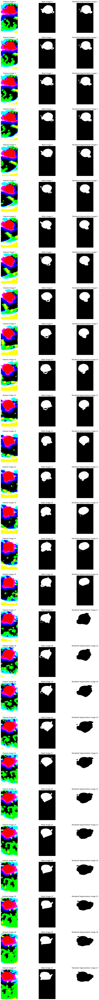

In [78]:
num_vis = min(28, num_images)
fig, axes = plt.subplots(num_vis, 3, figsize=(15, 5*num_vis))

for i in range(num_vis):
    axes[i, 0].imshow(feature_images[i].transpose(1, 2, 0))
    axes[i, 0].set_title(f"Feature Image {i}")
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(resized_mask_images[i], cmap='gray')
    axes[i, 1].set_title(f"Mask Image {i}")
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(clustered_images[i], cmap='gray')
    axes[i, 2].set_title(f"Rendered Segmentation Image {i}")
    axes[i, 2].axis('off')


### Actual Function Below

#### Cluster Code

In [20]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

def cluster_with_dbscan(feature_image, eps=0.5, min_samples=5):
    c, h, w = feature_image.shape
    feature_image_flat = feature_image.reshape(c, -1).T
    
    # Standardize features
    scaler = StandardScaler()
    feature_image_scaled = scaler.fit_transform(feature_image_flat)
    
    # Apply DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(feature_image_scaled)
    
    # DBSCAN may produce more than 2 clusters, so we need to binarize the result
    unique_labels = np.unique(labels)
    if len(unique_labels) > 2:
        # Assign the most common non-noise label as foreground
        counts = np.bincount(labels[labels != -1])
        foreground_label = np.argmax(counts)
        binary_labels = (labels == foreground_label).astype(int)
    else:
        binary_labels = (labels == 1).astype(int)
    
    return binary_labels.reshape(h, w)


from sklearn.mixture import GaussianMixture

def cluster_with_gmm(feature_image, n_components=2):
    c, h, w = feature_image.shape
    feature_image_flat = feature_image.reshape(c, -1).T
    
    # Apply GMM
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    labels = gmm.fit_predict(feature_image_flat)
    
    return labels.reshape(h, w)

from sklearn.cluster import MeanShift, estimate_bandwidth

def cluster_with_meanshift(feature_image):
    c, h, w = feature_image.shape
    feature_image_flat = feature_image.reshape(c, -1).T
    
    # Estimate bandwidth
    bandwidth = estimate_bandwidth(feature_image_flat, quantile=0.2, n_samples=500)
    
    # Apply MeanShift
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
    labels = ms.fit_predict(feature_image_flat)
    
    # Convert to binary (2 clusters)
    unique_labels = np.unique(labels)
    if len(unique_labels) > 2:
        counts = np.bincount(labels)
        top_two_labels = np.argsort(counts)[-2:]
        binary_labels = np.isin(labels, top_two_labels[1]).astype(int)
    else:
        binary_labels = labels
    
    return binary_labels.reshape(h, w)

from sklearn.cluster import SpectralClustering

def cluster_with_spectral(feature_image, n_clusters=2):
    c, h, w = feature_image.shape
    feature_image_flat = feature_image.reshape(c, -1).T
    
    # Apply Spectral Clustering
    spectral = SpectralClustering(n_clusters=n_clusters, assign_labels="discretize", random_state=42)
    labels = spectral.fit_predict(feature_image_flat)
    
    return labels.reshape(h, w)

from sklearn.cluster import AgglomerativeClustering

def cluster_with_agglomerative(feature_image, n_clusters=2):
    c, h, w = feature_image.shape
    feature_image_flat = feature_image.reshape(c, -1).T
    
    # Apply Agglomerative Clustering
    agglomerative = AgglomerativeClustering(n_clusters=n_clusters)
    labels = agglomerative.fit_predict(feature_image_flat)
    
    return labels.reshape(h, w)

from sklearn.cluster import MiniBatchKMeans

def cluster_with_minibatch_kmeans(feature_image, n_clusters=2):
    c, h, w = feature_image.shape
    feature_image_flat = feature_image.reshape(c, -1).T
    
    # Apply Mini-Batch K-means
    mbk = MiniBatchKMeans(n_clusters=n_clusters, random_state=42)
    labels = mbk.fit_predict(feature_image_flat)
    
    return labels.reshape(h, w)

##### Function Implementation

In [21]:
import argparse
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

import torch
from utils.camera_utils import Camera
from clustering import DinoModel
from gaussian_renderer import render
from arguments import ModelParams, PipelineParams
import argparse
import os

def multi_dino_segmentation(model_path, mask_images_path, num_clusters=2, num_images=29, clustering_method='gmm'):
    # Step 1: Create an argument parser
    parser = argparse.ArgumentParser(description="Model and Pipeline Parameters")

    # Step 2: Initialize ModelParams and PipelineParams
    model_params = ModelParams(parser)
    pipeline_params = PipelineParams(parser)

    # Step 3: Parse the arguments and set the model path
    args = parser.parse_args([])  # Use empty list to parse default values
    args.model_path = model_path

    # Extract the parameters
    model_args = model_params.extract(args)
    pipe_args = pipeline_params.extract(args)

    # Step 4: Initialize the DinoModel with the extracted parameters
    dino_model = DinoModel(model_args, pipe_args)

    # Step 5: Load the pre-trained Gaussian model
    dino_model.load_model(args.model_path)

    sorted_cameras = sorted(dino_model.cameras, key=lambda x: int(x.image_name))

    def render_multi_dino_feature_image(camera):
        dino_modes = ['dino1', 'dino2', 'dino3', 'dino4']
        feature_images = []
        
        with torch.no_grad():
            for mode in dino_modes:
                render_pkg = render(camera, dino_model.gaussians, dino_model.pipe, 
                                    torch.tensor([0.0, 0.0, 0.0], device="cuda"), mode=mode)
                image = render_pkg['render']
                feature_images.append(image.cpu().numpy())
        
        # Concatenate all DINO features
        return np.concatenate(feature_images, axis=0)


    multi_dino_feature_images = []
    for cam_id, camera in enumerate(sorted_cameras):
        multi_dino_image = render_multi_dino_feature_image(camera)
        255 - multi_dino_image
        multi_dino_feature_images.append(multi_dino_image)


    def load_mask_images(path, num_images):
        mask_images = []
        for i in range(1, num_images):
            mask_path = os.path.join(path, f"{i:03d}.jpg.png")
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            if mask is None:
                print(f"Warning: Unable to load image at {mask_path}")
                continue
            mask = mask / 255.0  # Normalize to [0, 1]
            mask_images.append(mask)
        return mask_images

    mask_images = load_mask_images(mask_images_path, num_images)

    def cluster_multi_dino_feature_image(feature_image, n_clusters):
        c, h, w = feature_image.shape
        feature_image_flat = feature_image.reshape(c, -1).T
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        labels = kmeans.fit_predict(feature_image_flat)
        return labels.reshape(h, w)

    if clustering_method == 'meanshift':
        clustered_images = [cluster_with_meanshift(img) for img in multi_dino_feature_images]
    elif clustering_method == 'spectral':
        clustered_images = [cluster_with_spectral(img, n_clusters=num_clusters) for img in multi_dino_feature_images]
    elif clustering_method == 'agglomerative':
        clustered_images = [cluster_with_agglomerative(img, n_clusters=num_clusters) for img in multi_dino_feature_images]
    elif clustering_method == 'minibatch_kmeans':
        clustered_images = [cluster_with_minibatch_kmeans(img, n_clusters=num_clusters) for img in multi_dino_feature_images]
    elif clustering_method == 'gmm':
        clustered_images = [cluster_with_gmm(img, n_components=num_clusters) for img in multi_dino_feature_images]
    else:  # default to K-means
        clustered_images = [cluster_multi_dino_feature_image(img, num_clusters) for img in multi_dino_feature_images]

    # Resize mask images to match clustered images
    resized_mask_images = []
    for mask, clustered in zip(mask_images, clustered_images):
        resized_mask = cv2.resize(mask, (clustered.shape[1], clustered.shape[0]), interpolation=cv2.INTER_NEAREST)
        resized_mask_images.append(resized_mask)

    # Visualization
    num_vis = min(3, num_images)
    fig, axes = plt.subplots(num_vis, 3, figsize=(15, 5*num_vis))

    for i in range(num_vis):
        axes[i, 0].imshow(multi_dino_feature_images[i][:3].transpose(1, 2, 0))
        axes[i, 0].set_title(f"Feature Image {i}")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(resized_mask_images[i], cmap='gray')
        axes[i, 1].set_title(f"Mask Image {i}")
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(255 - clustered_images[i], cmap='gray')
        axes[i, 2].set_title(f"Rendered Segmentation Image {i}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

    def calculate_iou(pred, target):
        def iou(p, t):
            intersection = np.logical_and(p, t)
            union = np.logical_or(p, t)
            return np.sum(intersection) / (np.sum(union) + 1e-10)
        
        # Calculate IoU for both regular and inverted prediction
        iou_regular = iou(pred, target)
        iou_inverted = iou(1 - pred, target)
        
        # Return the maximum of the two
        return max(iou_regular, iou_inverted)

    def calculate_miou(predictions, targets):
        ious = []
        for pred, target in zip(predictions, targets):
            # Ensure binary masks
            pred_binary = (pred > 0.5).astype(int)
            target_binary = (target > 0.5).astype(int)
            
            iou = calculate_iou(pred_binary, target_binary)
            ious.append(iou)
        return np.mean(ious)

    miou = calculate_miou(clustered_images, resized_mask_images)
    print(f"mIOU using multi-DINO features: {miou:.4f}")

    return miou


# Example usage:
# model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\85959dba-6\\all_vars.pth"
# mask_images_path = "C:\\Users\\ykirc\\Desktop\\1a00dded"
# miou = multi_dino_segmentation(model_path, mask_images_path, num_clusters=2)

### Usage


[Loading the gaussian model]


c:\Users\ykirc\Documents\GitHub\thesis\sequential-training\clustering.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  saved_dict = torch.load(model_path)


[Gaussian model created successfully]

[Loading the gaussian model]
[Gaussian model created successfully]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.201997..11.7095785].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.173419..11.72565].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.157077..11.697898].


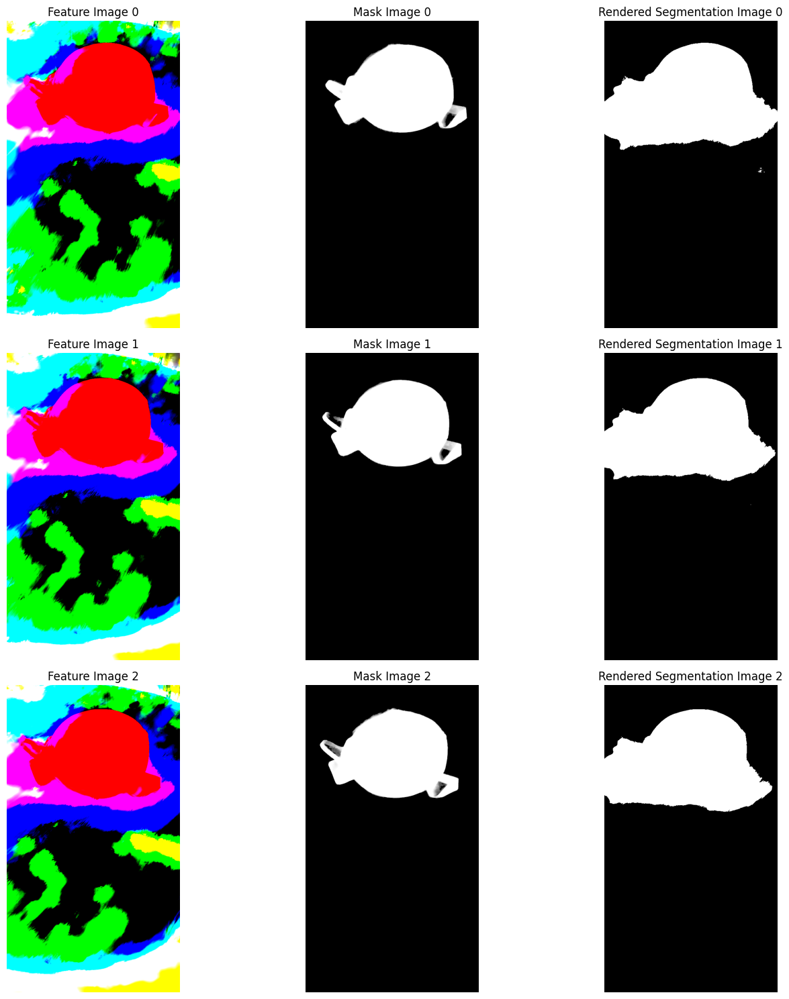

mIOU using multi-DINO features: 0.5794


In [23]:
model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\85959dba-6\\all_vars.pth"
mask_images_path = "C:\\Users\\ykirc\\Desktop\\1a00dded"
miou = multi_dino_segmentation(model_path, mask_images_path, num_clusters=2, clustering_method='k-means')

### Experiments

##### 1a010a38


[Loading the gaussian model]


c:\Users\ykirc\Documents\GitHub\thesis\sequential-training\clustering.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  saved_dict = torch.load(model_path)


[Gaussian model created successfully]

[Loading the gaussian model]
[Gaussian model created successfully]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.336678..12.097165].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.3135..12.098737].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.342817..12.095455].


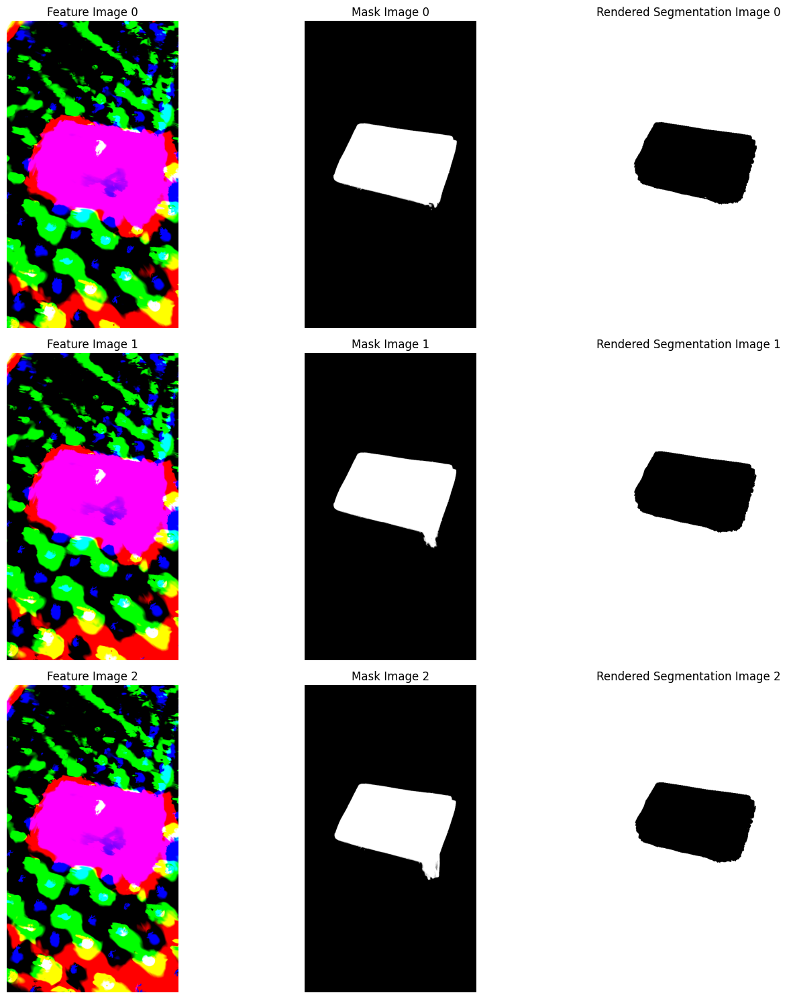

mIOU using multi-DINO features: 0.7273


In [62]:
model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\75ba3586-0\\all_vars.pth"
mask_images_path = "C:\\Users\\ykirc\\Desktop\\1a010a38"
miou = multi_dino_segmentation(model_path, mask_images_path, num_clusters=2, num_images=30, clustering_method='meanshift')

#### 140177ad


[Loading the gaussian model]


c:\Users\ykirc\Documents\GitHub\thesis\sequential-training\clustering.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  saved_dict = torch.load(model_path)


[Gaussian model created successfully]

[Loading the gaussian model]
[Gaussian model created successfully]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.337023..10.876371].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.396363..10.955864].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.554772..11.298525].


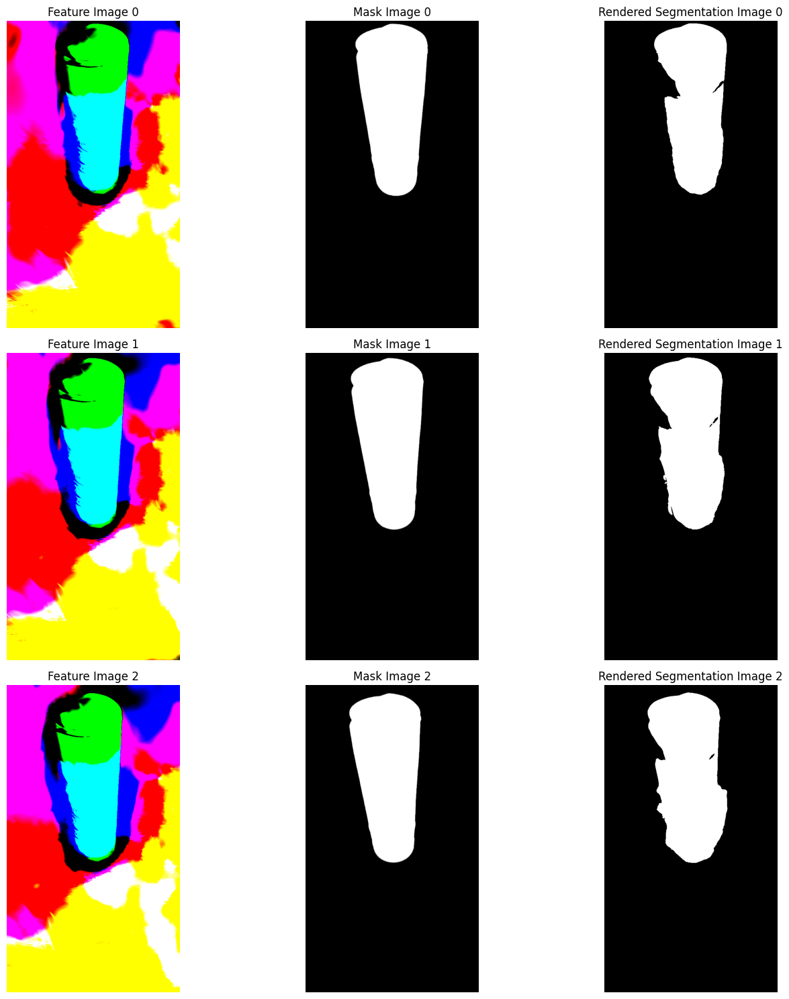

mIOU using multi-DINO features: 0.6604


In [82]:
model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\48be8b57-9\\all_vars.pth"
mask_images_path = "C:\\Users\\ykirc\\Desktop\\input-scenes\\140177ad\\140177ad"
miou = multi_dino_segmentation(model_path, mask_images_path, num_clusters=2, num_images=32, clustering_method='meanshift')

#### 25914d3f


[Loading the gaussian model]
[Gaussian model created successfully]

[Loading the gaussian model]
[Gaussian model created successfully]


c:\Users\ykirc\.conda\envs\tf-gpu7\lib\site-packages\threadpoolctl.py:1214: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.093726..11.32748].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.92465..11.435802].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.607359..11.284361].


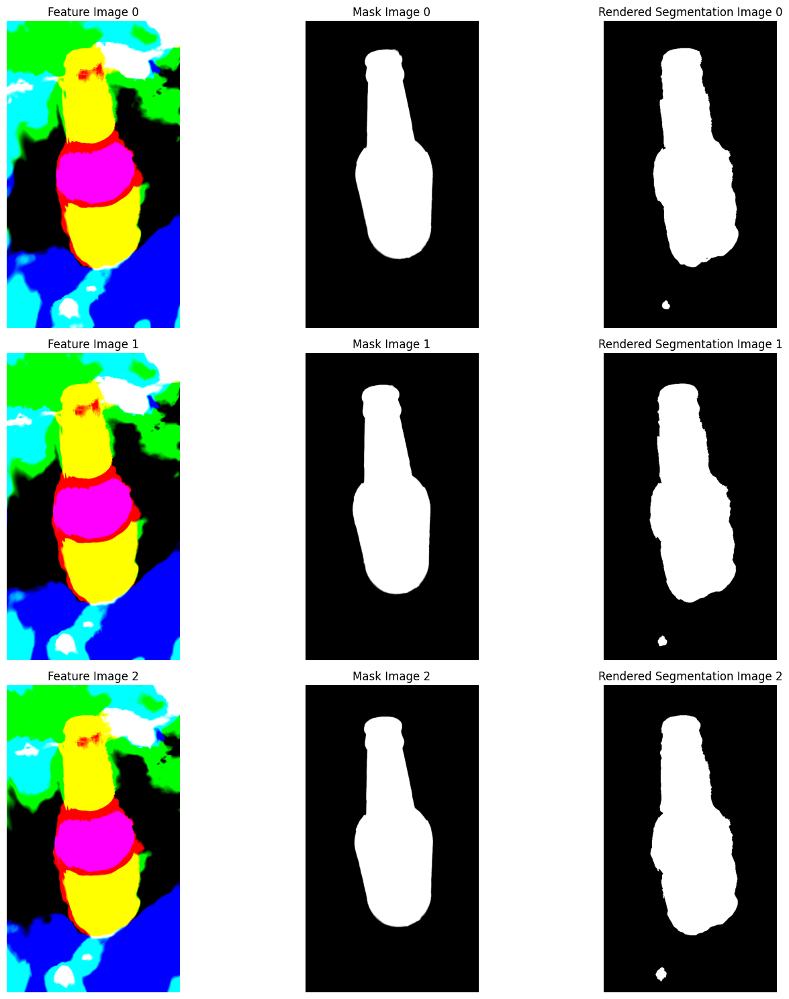

mIOU using multi-DINO features: 0.7965


In [9]:
model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\d1f621b0-c\\all_vars.pth"
mask_images_path = "C:\\Users\\ykirc\\Desktop\\input-scenes\\25014d3f\\25014d3f"
miou = multi_dino_segmentation(model_path, mask_images_path, num_clusters=2, num_images=30, clustering_method='meanshift')

#### Thresholding - Postprocess

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.201997..11.7095785].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.173419..11.72565].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.157077..11.697898].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.033909..11.499816].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-10.9845295..11.414716].


mIOU after post-processing: 0.7649


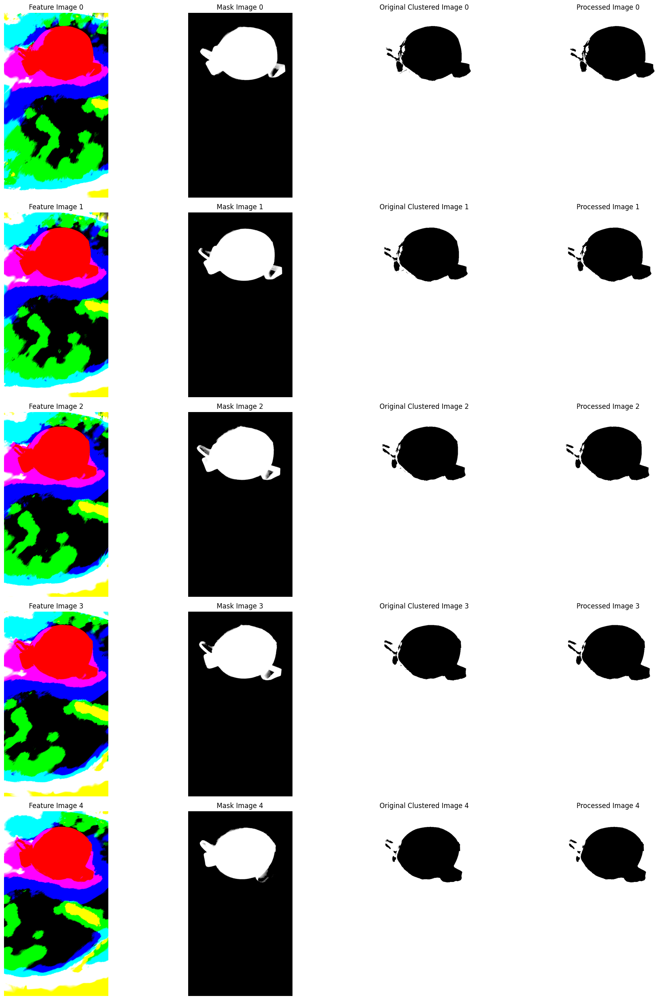

In [68]:
import numpy as np
import cv2
from scipy import ndimage
from skimage.morphology import remove_small_objects, remove_small_holes

def remove_small_regions(image, min_size=100):
    """Remove small isolated regions and fill small holes."""
    # Ensure the image is boolean
    image_bool = image.astype(bool)
    
    # Remove small objects
    cleaned = remove_small_objects(image_bool, min_size=min_size)
    
    # Fill small holes
    cleaned = remove_small_holes(cleaned, area_threshold=min_size)
    
    return cleaned.astype(np.uint8)

def apply_threshold(image, threshold=0.5):
    """Apply threshold to create binary image."""
    return (image > threshold).astype(np.uint8)

# Modify the clustering function to include post-processing
def cluster_and_postprocess(feature_image, n_clusters=2, min_region_size=100, threshold=0.5):
    clustered = cluster_multi_dino_feature_image(feature_image, n_clusters)
    
    # Ensure binary (0 and 1) output from clustering
    clustered_binary = (clustered == clustered.max()).astype(np.uint8)
    
    # Remove small regions
    cleaned = remove_small_regions(clustered_binary, min_size=min_region_size)
    
    # Apply threshold
    thresholded = apply_threshold(cleaned, threshold)
    
    return thresholded

# The rest of the code remains the same

# Apply the new processing to all images
processed_images = [cluster_and_postprocess(img) for img in multi_dino_feature_images]

# Recalculate mIOU with the processed images
miou = calculate_miou(processed_images, resized_mask_images)
print(f"mIOU after post-processing: {miou:.4f}")

# Visualize the results
num_vis = min(5, num_images)
fig, axes = plt.subplots(num_vis, 4, figsize=(20, 5*num_vis))

for i in range(num_vis):
    axes[i, 0].imshow(multi_dino_feature_images[i][:3].transpose(1, 2, 0))
    axes[i, 0].set_title(f"Feature Image {i}")
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(resized_mask_images[i], cmap='gray')
    axes[i, 1].set_title(f"Mask Image {i}")
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(255 - clustered_images[i], cmap='gray')
    axes[i, 2].set_title(f"Original Clustered Image {i}")
    axes[i, 2].axis('off')
    
    axes[i, 3].imshow(255 - processed_images[i], cmap='gray')
    axes[i, 3].set_title(f"Processed Image {i}")
    axes[i, 3].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import os
import shutil

# Define the source and destination folders
source_folder = "C:\\Users\\ykirc\\Desktop\\scene0169\\color"
destination_folder = "C:\\Users\\ykirc\\Desktop\\input-scenes\\comp\\input"

# Create the destination folder if it doesn't exist
if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)

# Get the list of all files in the source folder
files = os.listdir(source_folder)

# Filter only image files based on your requirements
image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff']
image_files = [f for f in files if os.path.splitext(f)[1].lower() in image_extensions]

# Sort the files numerically by extracting numbers from filenames
image_files.sort(key=lambda x: int(os.path.splitext(x)[0]))

# Copy every 10th image to the destination folder, keeping the original filenames
for index, file in enumerate(image_files):
    if index % 10 == 0:  # Every 10th image (0-based index, starting from 0.jpg)
        source_path = os.path.join(source_folder, file)
        destination_path = os.path.join(destination_folder, file)
        shutil.copy2(source_path, destination_path)
        print(f'Copied: {file} as {file}')

print('Done!')


### SceneNET Scene Eval

In [32]:
model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\3d147ded-0\\all_vars.pth"

In [33]:
import argparse
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

import torch
from clustering import DinoModel
from gaussian_renderer import render
from arguments import ModelParams, PipelineParams
from sklearn.metrics import adjusted_rand_score

In [34]:
# Step 1-5: Initialize and load the model (same as before)
parser = argparse.ArgumentParser(description="Model and Pipeline Parameters")
model_params = ModelParams(parser)
pipeline_params = PipelineParams(parser)
args = parser.parse_args([])
args.model_path = model_path
model_args = model_params.extract(args)
pipe_args = pipeline_params.extract(args)
dino_model = DinoModel(model_args, pipe_args)


[Loading the gaussian model]
[Gaussian model created successfully]


In [54]:
dino_model.load_model(args.model_path)
# Sort cameras and select every 20th camera
sorted_cameras = sorted(dino_model.cameras, key=lambda x: int(x.image_name))
selected_cameras = sorted_cameras[::20]


[Loading the gaussian model]


c:\Users\ykirc\Documents\GitHub\thesis\sequential-training\clustering.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  saved_dict = torch.load(model_path)


[Gaussian model created successfully]


In [48]:
sorted_cameras = sorted(dino_model.cameras, key=lambda x: int(x.image_name))

In [49]:
def render_multi_dino_feature_image(camera):
    dino_modes = ['dino1', 'dino2', 'dino3', 'dino4']
    feature_images = []
    with torch.no_grad():
        for mode in dino_modes:
            render_pkg = render(camera, dino_model.gaussians, dino_model.pipe, 
                                torch.tensor([0.0, 0.0, 0.0], device="cuda"), mode=mode)
            image = render_pkg['render']
            feature_images.append(image.cpu().numpy())
    return np.concatenate(feature_images, axis=0)


multi_dino_feature_images = []
for camera in sorted_cameras:
    multi_dino_image = render_multi_dino_feature_image(camera)
    multi_dino_feature_images.append(multi_dino_image)

In [50]:
def load_mask_images(path):
    mask_images = []
    for i in range(0, 2021, 20):
        mask_path = os.path.join(path, f"{i:01d}.png")
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            print(f"Warning: Unable to load image at {mask_path}")
            continue
        mask_images.append(mask)
    return mask_images

mask_images_path = "C:\\Users\\ykirc\\Desktop\\input-scenes\\comp\\label-480"
mask_images = load_mask_images(mask_images_path)

In [51]:
def cluster_multi_dino_feature_image(feature_image, n_clusters=None):
    c, h, w = feature_image.shape
    feature_image_flat = feature_image.reshape(c, -1).T
    if n_clusters is None:
        # Use a method to estimate the number of clusters, e.g., elbow method
        n_clusters = estimate_clusters(feature_image_flat)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(feature_image_flat)
    return labels.reshape(h, w)

def estimate_clusters(data):
    # Implement a method to estimate the number of clusters
    # This is a simplified example using the elbow method
    max_clusters = 10
    inertias = []
    for k in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        inertias.append(kmeans.inertia_)
    
    # Find the elbow point (you might want to implement a more sophisticated method)
    diffs = np.diff(inertias)
    elbow_point = np.argmin(diffs) + 1
    return max(2, elbow_point)  # Ensure at least 2 clusters

clustered_images = [cluster_multi_dino_feature_image(img) for img in multi_dino_feature_images]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.468552..5.2382946].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.375576..5.2725115].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.4125648..5.218222].


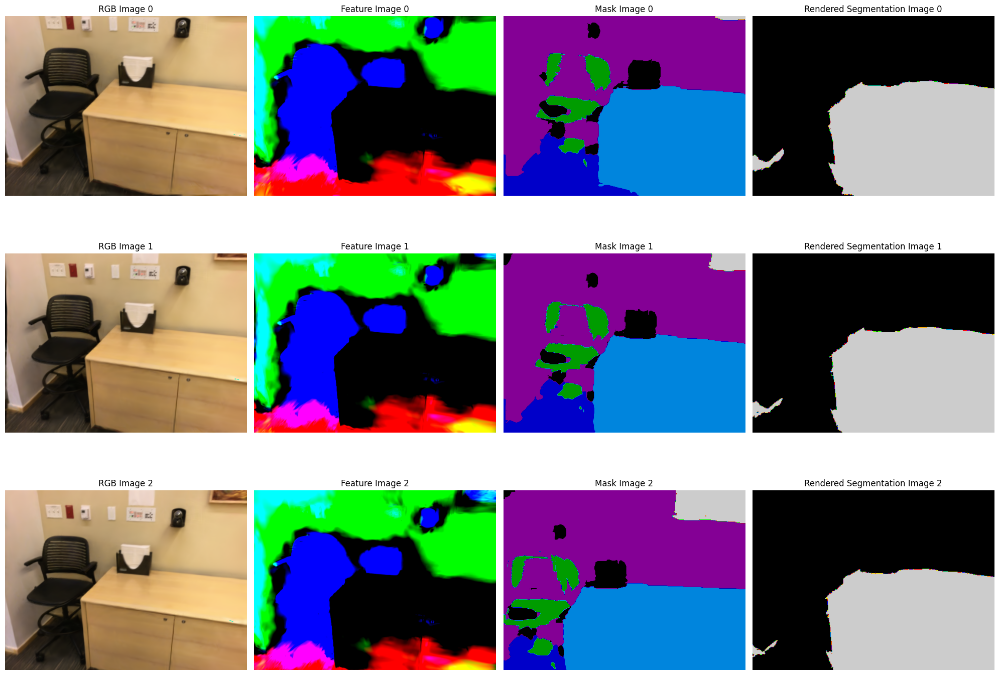

In [52]:
def render_rgb_image(camera):
    with torch.no_grad():
        render_pkg = render(camera, dino_model.gaussians, dino_model.pipe, 
                            torch.tensor([0.0, 0.0, 0.0], device="cuda"), mode='rgb')
        image = render_pkg['render']
    return (image.cpu().numpy() * 255).astype(np.uint8).transpose(1, 2, 0)

# Render RGB images
rgb_images = [render_rgb_image(camera) for camera in sorted_cameras]

# Resize mask images to match clustered images
resized_mask_images = []
for mask, clustered in zip(mask_images, clustered_images):
    resized_mask = cv2.resize(mask, (clustered.shape[1], clustered.shape[0]), interpolation=cv2.INTER_NEAREST)
    resized_mask_images.append(resized_mask)

# Visualization
num_vis = min(3, len(clustered_images))
fig, axes = plt.subplots(num_vis, 4, figsize=(20, 5*num_vis))

for i in range(num_vis):
    axes[i, 0].imshow(rgb_images[i])
    axes[i, 0].set_title(f"RGB Image {i}")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(multi_dino_feature_images[i][:3].transpose(1, 2, 0))
    axes[i, 1].set_title(f"Feature Image {i}")
    axes[i, 1].axis('off')
    
    axes[i, 2].imshow(resized_mask_images[i], cmap='nipy_spectral')
    axes[i, 2].set_title(f"Mask Image {i}")
    axes[i, 2].axis('off')
    
    axes[i, 3].imshow(clustered_images[i], cmap='nipy_spectral')
    axes[i, 3].set_title(f"Rendered Segmentation Image {i}")
    axes[i, 3].axis('off')

plt.tight_layout()
plt.show()

In [53]:
def calculate_miou(predictions, targets):
    ious = []
    for pred, target in zip(predictions, targets):
        # Flatten the arrays
        pred_flat = pred.flatten()
        target_flat = target.flatten()

        # Calculate Adjusted Rand Index
        ari = adjusted_rand_score(target_flat, pred_flat)
        ious.append(ari)

    return np.mean(ious)

miou = calculate_miou(clustered_images, resized_mask_images)
print(f"mIOU (Adjusted Rand Index) using multi-DINO features: {miou:.4f}")


mIOU (Adjusted Rand Index) using multi-DINO features: 0.1178


In [19]:
import torch
import clip
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
import numpy as np
from sklearn.decomposition import PCA

# Load the CLIP model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

## Multi Class Score

In [1]:
import argparse
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

import torch
from utils.camera_utils import Camera
from clustering import DinoModel
from gaussian_renderer import render
from arguments import ModelParams, PipelineParams
import argparse
import os

def multi_dino_segmentation(model_path, mask_images_path, num_clusters=2, num_images=29, clustering_method='gmm'):
    # Step 1: Create an argument parser
    parser = argparse.ArgumentParser(description="Model and Pipeline Parameters")

    # Step 2: Initialize ModelParams and PipelineParams
    model_params = ModelParams(parser)
    pipeline_params = PipelineParams(parser)

    # Step 3: Parse the arguments and set the model path
    args = parser.parse_args([])  # Use empty list to parse default values
    args.model_path = model_path

    # Extract the parameters
    model_args = model_params.extract(args)
    pipe_args = pipeline_params.extract(args)

    # Step 4: Initialize the DinoModel with the extracted parameters
    dino_model = DinoModel(model_args, pipe_args)

    # Step 5: Load the pre-trained Gaussian model
    dino_model.load_model(args.model_path)

    sorted_cameras = sorted(dino_model.cameras, key=lambda x: int(x.image_name))

    def render_multi_dino_feature_image(camera):
        dino_modes = ['dino1', 'dino2', 'dino3', 'dino4']
        feature_images = []
        
        with torch.no_grad():
            for mode in dino_modes:
                render_pkg = render(camera, dino_model.gaussians, dino_model.pipe, 
                                    torch.tensor([0.0, 0.0, 0.0], device="cuda"), mode=mode)
                image = render_pkg['render']
                feature_images.append(image.cpu().numpy())
        
        # Concatenate all DINO features
        return np.concatenate(feature_images, axis=0)


    multi_dino_feature_images = []
    for cam_id, camera in enumerate(sorted_cameras):
        multi_dino_image = render_multi_dino_feature_image(camera)
        255 - multi_dino_image
        multi_dino_feature_images.append(multi_dino_image)


    def load_mask_images(path, num_images):
        mask_images = {}
        for folder in os.listdir(path):
            if folder.isdigit():
                image_masks = []
                folder_path = os.path.join(path, folder)
                for mask_file in os.listdir(folder_path):
                    if mask_file.endswith('.png'):
                        mask_path = os.path.join(folder_path, mask_file)
                        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                        if mask is None:
                            print(f"Warning: Unable to load image at {mask_path}")
                            continue
                        mask = mask / 255.0  # Normalize to [0, 1]
                        image_masks.append(mask)
                mask_images[int(folder)] = image_masks
        return mask_images

    mask_images = load_mask_images(mask_images_path, num_images)

    def cluster_multi_dino_feature_image(feature_image, n_clusters):
        c, h, w = feature_image.shape
        feature_image_flat = feature_image.reshape(c, -1).T
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        labels = kmeans.fit_predict(feature_image_flat)
        return labels.reshape(h, w)

    if clustering_method == 'meanshift':
        clustered_images = [cluster_with_meanshift(img) for img in multi_dino_feature_images]
    elif clustering_method == 'spectral':
        clustered_images = [cluster_with_spectral(img, n_clusters=num_clusters) for img in multi_dino_feature_images]
    elif clustering_method == 'agglomerative':
        clustered_images = [cluster_with_agglomerative(img, n_clusters=num_clusters) for img in multi_dino_feature_images]
    elif clustering_method == 'minibatch_kmeans':
        clustered_images = [cluster_with_minibatch_kmeans(img, n_clusters=num_clusters) for img in multi_dino_feature_images]
    elif clustering_method == 'gmm':
        clustered_images = [cluster_with_gmm(img, n_components=num_clusters) for img in multi_dino_feature_images]
    else:  # default to K-means
        clustered_images = [cluster_multi_dino_feature_image(img, num_clusters) for img in multi_dino_feature_images]

    # Resize mask images to match clustered images
    resized_mask_images = []
    for mask, clustered in zip(mask_images, clustered_images):
        resized_mask = cv2.resize(mask, (clustered.shape[1], clustered.shape[0]), interpolation=cv2.INTER_NEAREST)
        resized_mask_images.append(resized_mask)

    # Visualization
    num_vis = min(3, num_images)
    fig, axes = plt.subplots(num_vis, 3, figsize=(15, 5*num_vis))

    for i in range(num_vis):
        axes[i, 0].imshow(multi_dino_feature_images[i][:3].transpose(1, 2, 0))
        axes[i, 0].set_title(f"Feature Image {i}")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(resized_mask_images[i], cmap='gray')
        axes[i, 1].set_title(f"Mask Image {i}")
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(255 - clustered_images[i], cmap='gray')
        axes[i, 2].set_title(f"Rendered Segmentation Image {i}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

    def calculate_iou(pred, target):
        def iou(p, t):
            intersection = np.logical_and(p, t)
            union = np.logical_or(p, t)
            return np.sum(intersection) / (np.sum(union) + 1e-10)
        
        # Calculate IoU for both regular and inverted prediction
        iou_regular = iou(pred, target)
        iou_inverted = iou(1 - pred, target)
        
        # Return the maximum of the two
        return max(iou_regular, iou_inverted)

    def calculate_miou(predictions, targets):
        def calculate_iou(pred, target):
            intersection = np.logical_and(pred, target)
            union = np.logical_or(pred, target)
            return np.sum(intersection) / (np.sum(union) + 1e-10)

        ious = []
        for pred, target_masks in zip(predictions, targets.values()):
            pred_clusters = np.unique(pred)
            max_iou = 0
            for target in target_masks:
                target_resized = cv2.resize(target, (pred.shape[1], pred.shape[0]), interpolation=cv2.INTER_NEAREST)
                for cluster in pred_clusters:
                    pred_binary = (pred == cluster).astype(int)
                    iou = calculate_iou(pred_binary, target_resized)
                    max_iou = max(max_iou, iou)
            ious.append(max_iou)
        return np.mean(ious)

    miou = calculate_miou(clustered_images, mask_images)
    print(f"mIOU using multi-DINO features: {miou:.4f}")

    # Visualization
    num_vis = min(3, len(clustered_images))
    fig, axes = plt.subplots(num_vis, 3, figsize=(15, 5*num_vis))

    for i in range(num_vis):
        axes[i, 0].imshow(multi_dino_feature_images[i][:3].transpose(1, 2, 0))
        axes[i, 0].set_title(f"Feature Image {i}")
        axes[i, 0].axis('off')
        
        # Show the first mask for each image
        first_mask = list(mask_images.values())[i][0]
        axes[i, 1].imshow(first_mask, cmap='gray')
        axes[i, 1].set_title(f"First Mask Image {i}")
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(clustered_images[i], cmap='nipy_spectral')
        axes[i, 2].set_title(f"Rendered Segmentation Image {i}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

    return miou



# Example usage:
# model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\85959dba-6\\all_vars.pth"
# mask_images_path = "C:\\Users\\ykirc\\Desktop\\1a00dded"
# miou = multi_dino_segmentation(model_path, mask_images_path, num_clusters=2)

ImportError: cannot import name 'cameraList_from_camInfos' from partially initialized module 'utils.camera_utils' (most likely due to a circular import) (c:\Users\ykirc\Documents\GitHub\thesis\sequential-training\utils\camera_utils.py)


[Loading the gaussian model]


c:\Users\ykirc\Documents\GitHub\thesis\sequential-training\clustering.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  saved_dict = torch.load(model_path)


[Gaussian model created successfully]

[Loading the gaussian model]
[Gaussian model created successfully]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.446694..12.28074].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.446911..12.319868].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.447466..12.357457].


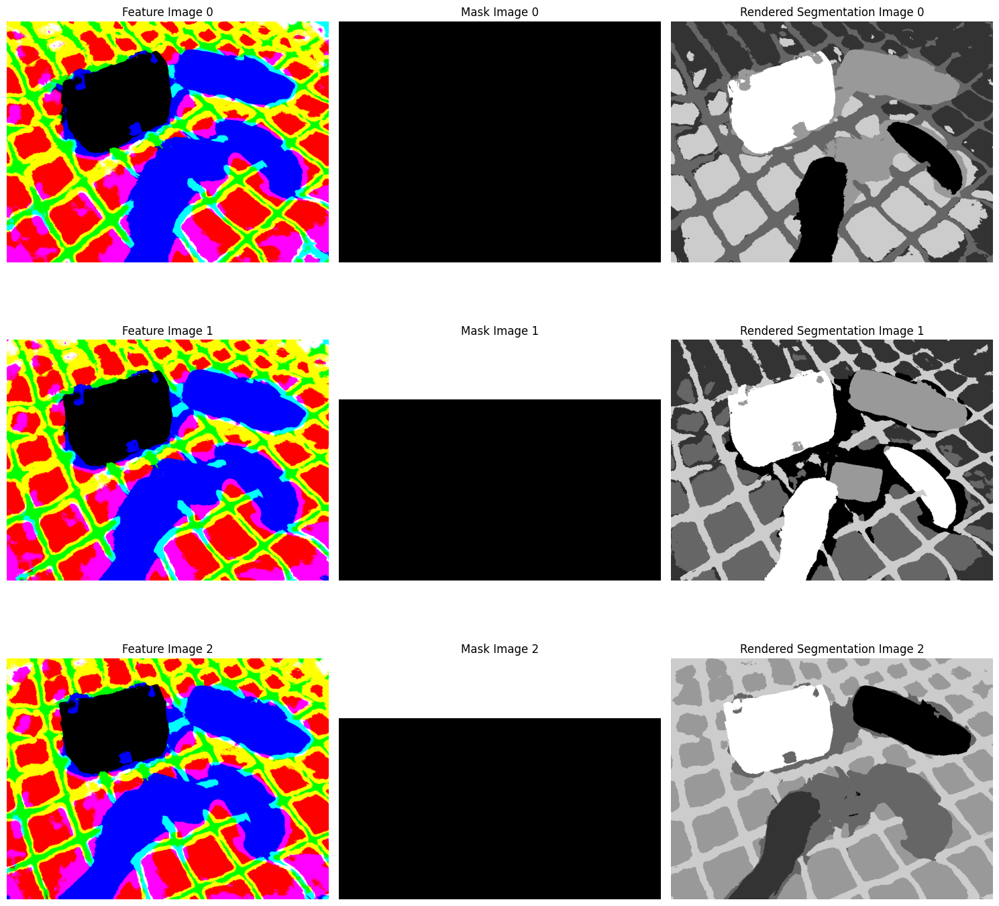

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.446694..12.28074].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.446911..12.319868].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-12.447466..12.357457].


mIOU using multi-DINO features: 0.5299


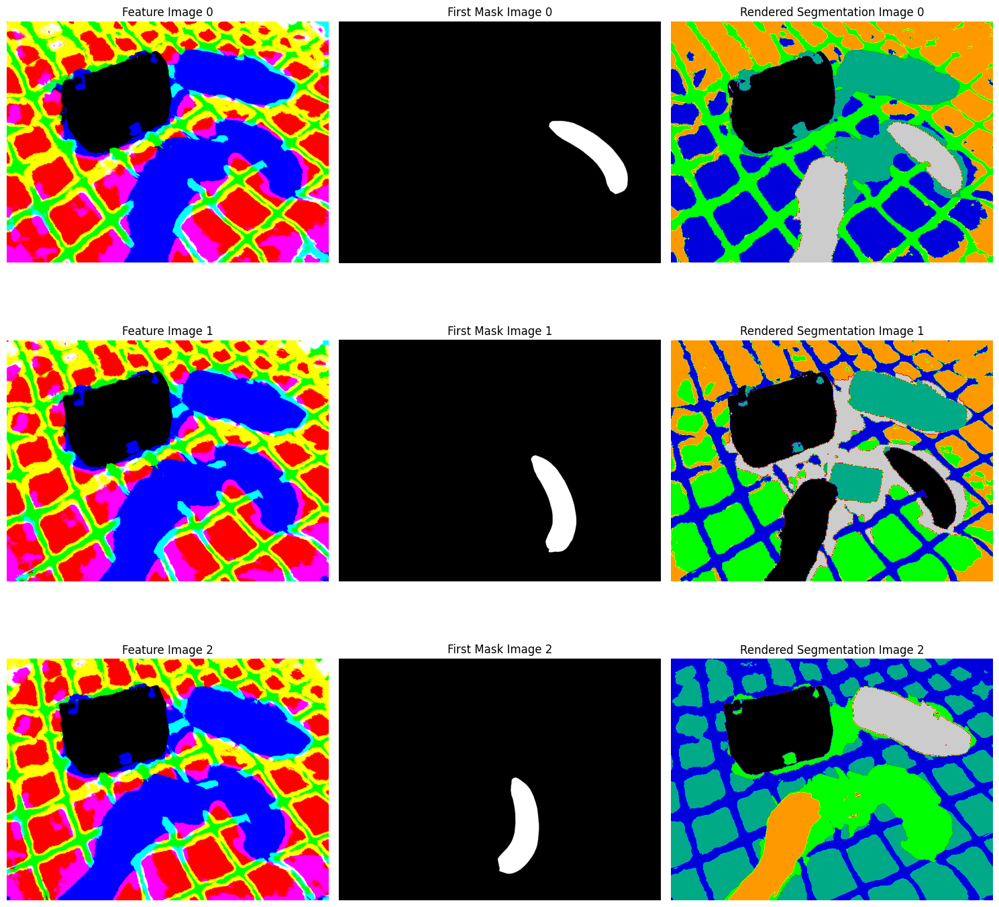

In [6]:
model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\bed\\all_vars.pth"
mask_images_path = "C:\\Users\\ykirc\\Desktop\\bed\\segmentations"
miou = multi_dino_segmentation(model_path, mask_images_path, num_clusters=6, num_images=36, clustering_method='kmeans')

# Custom-Scene

In [31]:
import argparse
import torch
import numpy as np
import matplotlib.pyplot as plt
import re
from utils.camera_utils import Camera
from clustering import DinoModel
from gaussian_renderer import render
from arguments import ModelParams, PipelineParams

def visualize_dino_features(model_path, frame_number):
    # Step 1: Create an argument parser
    parser = argparse.ArgumentParser(description="Model and Pipeline Parameters")

    # Step 2: Initialize ModelParams and PipelineParams
    model_params = ModelParams(parser)
    pipeline_params = PipelineParams(parser)

    # Step 3: Parse the arguments and set the model path
    args = parser.parse_args([])  # Use empty list to parse default values
    args.model_path = model_path

    # Extract the parameters
    model_args = model_params.extract(args)
    pipe_args = pipeline_params.extract(args)

    # Step 4: Initialize the DinoModel with the extracted parameters
    dino_model = DinoModel(model_args, pipe_args)

    # Step 5: Load the pre-trained Gaussian model
    dino_model.load_model(args.model_path)

    # Function to extract number from image name
    def extract_number(image_name):
        match = re.search(r'\d+', image_name)
        return int(match.group()) if match else 0

    # Sort cameras by image name
    try:
        sorted_cameras = sorted(dino_model.cameras, key=lambda x: extract_number(x.image_name))
    except AttributeError:
        print("Error: Cameras don't have 'image_name' attribute. Available attributes:")
        print(dir(dino_model.cameras[0]))
        return None

    # Select the camera for the specified frame
    if frame_number < 0 or frame_number >= len(sorted_cameras):
        print(f"Error: Frame number {frame_number} is out of range. Total frames: {len(sorted_cameras)}")
        return None

    camera = sorted_cameras[frame_number]

    # Render multi-DINO feature image
    dino_modes = ['dino1', 'dino2', 'dino3', 'dino4']
    feature_images = []

    with torch.no_grad():
        for mode in dino_modes:
            render_pkg = render(camera, dino_model.gaussians, dino_model.pipe, 
                                torch.tensor([0.0, 0.0, 0.0], device="cuda"), mode=mode)
            image = render_pkg['render']
            feature_images.append(image.cpu().numpy())

    # Concatenate all DINO features
    multi_dino_image = np.concatenate(feature_images, axis=0)

    # Visualize the feature image
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(multi_dino_image[:3].transpose(1, 2, 0))  # Show only the first 3 channels for visualization
    ax.set_title(f"DINO Feature Image for Frame {frame_number}")
    ax.axis('off')
    plt.show()

    return multi_dino_image


[Loading the gaussian model]
[Gaussian model created successfully]

[Loading the gaussian model]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-11.388643..11.31485].


[Gaussian model created successfully]


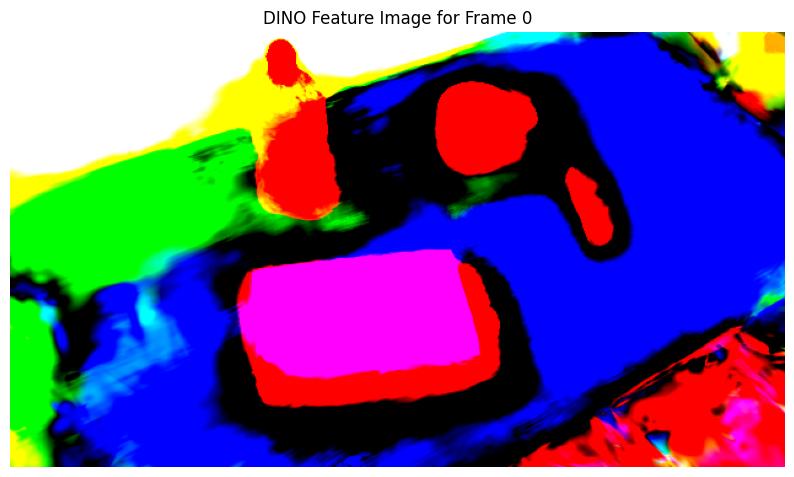

In [32]:
# Example usage:
model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\custom-scene\\all_vars.pth"
frame_number = 0  # Change this to visualize different frames
feature_image = visualize_dino_features(model_path, frame_number)

In [44]:
import os
import cv2
import numpy as np
import torch
from sklearn.cluster import KMeans
from clustering import DinoModel
from gaussian_renderer import render
from arguments import ModelParams, PipelineParams


def load_mask_images(frame_folder):
    mask_images = []
    print(f"Searching for mask images in: {frame_folder}")
    for root, dirs, files in os.walk(frame_folder):
        print(f"Current directory: {root}")
        print(f"Subdirectories: {dirs}")
        print(f"Files: {files}")
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                mask_path = os.path.join(root, file)
                print(f"Loading mask from: {mask_path}")
                mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                if mask is None:
                    print(f"Warning: Unable to load mask image at {mask_path}")
                    continue
                mask = mask / 255.0  # Normalize to [0, 1]
                mask_images.append(mask)
    if not mask_images:
        print(f"No valid mask images found in {frame_folder}")
    return mask_images

def calculate_miou(model_path, mask_folder):
    # Set up argument parser and model
    parser = argparse.ArgumentParser(description="Model and Pipeline Parameters")
    model_params = ModelParams(parser)
    pipeline_params = PipelineParams(parser)
    args = parser.parse_args([])
    args.model_path = model_path
    model_args = model_params.extract(args)
    pipe_args = pipeline_params.extract(args)

    # Initialize and load the DinoModel
    dino_model = DinoModel(model_args, pipe_args)
    dino_model.load_model(args.model_path)

    def extract_number(image_name):
        return int(image_name.split('_')[-1])

    sorted_cameras = sorted(dino_model.cameras, key=lambda x: extract_number(x.image_name))

    def render_multi_dino_feature_image(camera):
        dino_modes = ['dino1', 'dino2', 'dino3', 'dino4']
        feature_images = []
        
        with torch.no_grad():
            for mode in dino_modes:
                render_pkg = render(camera, dino_model.gaussians, dino_model.pipe, 
                                    torch.tensor([0.0, 0.0, 0.0], device="cuda"), mode=mode)
                image = render_pkg['render']
                feature_images.append(image.cpu().numpy())
        
        return np.concatenate(feature_images, axis=0)

    def cluster_multi_dino_feature_image(feature_image, n_clusters=5):
        c, h, w = feature_image.shape
        feature_image_flat = feature_image.reshape(c, -1).T
        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
        labels = kmeans.fit_predict(feature_image_flat)
        return labels.reshape(h, w)

    def calculate_iou(pred, target):
        intersection = np.logical_and(pred, target)
        union = np.logical_or(pred, target)
        return np.sum(intersection) / (np.sum(union) + 1e-10)

    def visualize_results(frame_name, multi_dino_image, clustered_image, mask_images, best_pred_masks):
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes[0, 0].imshow(multi_dino_image[:3].transpose(1, 2, 0))
        axes[0, 0].set_title("DINO Features")
        axes[0, 1].imshow(clustered_image, cmap='viridis')
        axes[0, 1].set_title("Clustered Image")
        
        combined_mask = np.zeros_like(mask_images[0])
        for i, mask in enumerate(mask_images):
            combined_mask += mask * (i + 1)
        axes[0, 2].imshow(combined_mask, cmap='viridis')
        axes[0, 2].set_title("Ground Truth Masks")
        
        combined_pred = np.zeros_like(best_pred_masks[0])
        for i, mask in enumerate(best_pred_masks):
            combined_pred += mask * (i + 1)
        axes[1, 0].imshow(combined_pred, cmap='viridis')
        axes[1, 0].set_title("Best Predicted Masks")
        
        diff = np.abs(combined_mask - combined_pred)
        axes[1, 1].imshow(diff, cmap='viridis')
        axes[1, 1].set_title("Difference")
        
        plt.tight_layout()
        plt.savefig(f"debug_{frame_name}.png")
        plt.close()

    total_iou = 0
    total_frames = 0

    for frame_folder in os.listdir(mask_folder):
        frame_path = os.path.join(mask_folder, frame_folder)
        if os.path.isdir(frame_path):
            try:
                frame_number = extract_number(frame_folder) - 1  # Assuming 1-indexed frame numbers
                if frame_number < 0 or frame_number >= len(sorted_cameras):
                    print(f"Warning: Frame number {frame_number+1} is out of range. Skipping.")
                    continue
                
                camera = sorted_cameras[frame_number]
                multi_dino_image = render_multi_dino_feature_image(camera)
                
                mask_images = load_mask_images(frame_path)
                if not mask_images:
                    print(f"Warning: No valid mask images found in {frame_path}. Skipping.")
                    continue
                
                clustered_image = cluster_multi_dino_feature_image(multi_dino_image, n_clusters=5)
                
                pred_masks = []
                for i in range(5):  # Always 5 clusters
                    pred_mask = (clustered_image == i).astype(float)
                    pred_masks.append(pred_mask)
                
                best_ious = []
                best_pred_masks = []
                for gt_mask in mask_images:
                    resized_gt = cv2.resize(gt_mask, (pred_masks[0].shape[1], pred_masks[0].shape[0]), interpolation=cv2.INTER_NEAREST)
                    ious = [calculate_iou(pred, resized_gt) for pred in pred_masks]
                    best_iou = max(ious)
                    best_ious.append(best_iou)
                    best_pred_masks.append(pred_masks[np.argmax(ious)])
                
                frame_miou = np.mean(best_ious)
                total_iou += frame_miou
                total_frames += 1
                
                print(f"Frame {frame_folder} mIoU: {frame_miou:.4f}")
                
                if debug:
                    visualize_results(frame_folder, multi_dino_image, clustered_image, mask_images, best_pred_masks)
                
            except Exception as e:
                print(f"Error processing {frame_folder}: {str(e)}")

    miou = total_iou / total_frames if total_frames > 0 else 0
    print(f"Overall mIOU score: {miou:.4f}")
    return miou


In [45]:
# Example usage:
model_path = "C:\\Users\\ykirc\\Documents\\GitHub\\thesis\\sequential-training\\output\\custom-scene\\all_vars.pth"
mask_folder = "C:\\Users\\ykirc\\Desktop\\extr-segs"
miou = calculate_miou(model_path, mask_folder)


[Loading the gaussian model]
[Gaussian model created successfully]

[Loading the gaussian model]
[Gaussian model created successfully]
Searching for mask images in: C:\Users\ykirc\Desktop\extr-segs\frame_0001
Current directory: C:\Users\ykirc\Desktop\extr-segs\frame_0001
Subdirectories: []
Files: ['book.png', 'bootle.png', 'cup.png', 'pen.png', 'white-sheet.png']
Loading mask from: C:\Users\ykirc\Desktop\extr-segs\frame_0001\book.png
Loading mask from: C:\Users\ykirc\Desktop\extr-segs\frame_0001\bootle.png
Loading mask from: C:\Users\ykirc\Desktop\extr-segs\frame_0001\cup.png
Loading mask from: C:\Users\ykirc\Desktop\extr-segs\frame_0001\pen.png
Loading mask from: C:\Users\ykirc\Desktop\extr-segs\frame_0001\white-sheet.png
Frame frame_0001 mIoU: 0.2323
Error processing frame_0001: name 'debug' is not defined
Searching for mask images in: C:\Users\ykirc\Desktop\extr-segs\frame_0057
Current directory: C:\Users\ykirc\Desktop\extr-segs\frame_0057
Subdirectories: []
Files: ['book.png', 'bo